#### Professor Mounya Elhilali, EN.520.645: Audio Signal Processing
# Project 1: Equal Loudness Curves (ELC)
Develop an ELC-based audio equalizer
### Harper Strickland
Due Sept. 22, 2026

In [1]:
# import libraries
from pydub import AudioSegment
from pydub.playback import play
from pydub.generators import Sine, WhiteNoise
import numpy as np
from numpy.fft import rfft, rfftfreq, irfft
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from scipy.interpolate import make_interp_spline
from math import ceil
from bisect import bisect_left
import librosa

If you have already measured and saved your ELC data, you can run the next cell and skip ahead to Audio Equalization

In [2]:
# start by loading personal data from csv if saved previously
dfspl = pd.read_csv('saved_spl.csv')

### Measure Personal Threshold and ELC

The following steps will measure the threshold and loudness perception of your own hearing. Please setup your surroundings to maximize the accuracy of the test. This includes turning off any fans or other ambient noises. Listening is best through wired, over-ear headphones. When you are ready, follow the steps below. Take breaks as needed to keep your hearing fresh. Note: results will not be clinically accurate due to variations in setting and equipment, but this process will provide approximate equal-loudness curves.

#### Step 1: Set Listening Volume Level

Set your playback audio level. Run the next two cells to make sure the loud music is not too loud, but you can still hear the soft music. First play the loud piece and set your volume as high as you can listen comfortably. Then check that you can still hear the soft music at that same volume level. Repeat these steps as needed.

**To interrupt/stop playback:** In command mode (not cell-edit mode),
- Jupyter Notebook: press the 'i' key twice
- VSCode: use the stop icon in the Python Interactive window
- Google Collab: press the keys Ctrl + 'm' 'i' 

In [ ]:
# volume level check: loud
audio = AudioSegment.from_file('Wendy_Carlos_Bach_loud.m4a') + 8
print('Audio file playing at {0:.2f} dBFS'.format(audio.dBFS))
play(audio)

In [ ]:
# volume level check: soft
audio = AudioSegment.from_file('Wendy_Carlos_Bach_soft.m4a') - 20
print('Audio file playing at {0:.2f} dBFS'.format(audio.dBFS))
play(audio)

#### Step 2: Measure Your 1st Equal-Loudness Curve: Comfortable Level

The process will start with a 1kHz tone, and use it as a reference for other frequencies. After the 1kHz volume is set, you will be asked to compare loudness between pairs of tones. Always make your best effort to choose which one is louder, even if they sound almost the same. The pairs will continue until the full curve is recorded. Follow the instructions to select the louder tone. If you cannot hear a tone, this could be due to system limitations; use '-8' to skip to the next frequency.

In [3]:
# define functions 

# prompt user for an integer input
def get_int(prompt_str):
    prompt_str += '\n'
    user_val = input(prompt_str)
    try:
        return int(user_val)
    except ValueError:
        print(f'{user_val} is not valid. Please try again and enter an integer.')
        return get_int(prompt_str)    

In [4]:
# generate and play a pure tone
def play_tone(freq, dur, vol): #duration in ms, vol in dBFS
    #create sine wave of given freq
    sine_wave = Sine(freq, sample_rate=44100, bit_depth=16)

    #Convert waveform to audio_segment for playback and export
    sine_segment = sine_wave.to_audio_segment(duration=dur, volume=vol)

    #Play audio segment
    play(sine_segment)

In [5]:
# play 1kHz tone and set volume level
# using variables set for whole environment: ref, dur
def set_1kHz(start_vol, prompt_str):
    vol = start_vol
    code = 1
    while(code != 0):
        play_tone(ref, dur, vol)
        code = get_int("Enter '2' to raise volume a lot, '1' to raise volume a little, '-1' to lower volume a little, '-2' to lower volume a lot, '0' to set volume at current level once you are certain")
        if code > 1:
            vol += 5
        elif code >0:
            vol += 1
        elif code <-1:
            vol += -5
        else:
            vol += -1
    return vol

In [6]:
# compare a pair of frequencies (reference is always ref, set to 1kHz above udfs)
def compare_pair(freq, ref_vol):
    # always start low
    vol = ref_vol - 10
    res = [0.0, 0.0, 0.0]
    res_count = 0
    last = [-60, -70, -80, -90]
    
    while (res_count < len(res)):
        # keep track of last 4 vol levels
        last.append(vol)
        last.pop(0)
        # 1kHz
        play_tone(ref, dur, ref_vol)
        # current comparison
        play_tone(freq, dur, vol)
        pick = get_int("Enter '0' if 1st tone is a lot louder, enter '1' if 1st tone is a little louder, enter '2' if second tone is louder. If you cannot hear a frequency after a few attempts, enter '-8'")
        if pick ==0:
            vol += 7
        elif pick == 1:
            vol += 1.5
        elif pick == 2:
            vol += -1.5
        elif pick == -8:
            # skip to next frequency
            res[res_count] = -90
            res_count += 1
            # reset starting volume for next iteration
            vol += -10
        else:
            print("You must choose, please try again")

        # record a result when last 4 levels zeroed in on a match
        if ((max(last)-min(last))<2.5):
            res[res_count] = np.mean(last)
            res_count += 1
            # reset starting volume for next iteration
            vol += -10
    print(res)
    return np.mean(res)

In [ ]:
# set static variables
# reference frequency, 1kHz
ref = 1000
# tone duration (ms)
dur = 500
# store 1kHz volume references
vol_ref = [ref]
# vol_ref order to be appended in upcoming steps: [0: freq, 1: comf, 2: min, 3: max, 4: soft, 5: med]

# create lists of frequencies to test
# Bark published critical band centers from https://ccrma.stanford.edu/~jos/bbt/Bark_Frequency_Scale.html
# <25Hz and >14kHz are beyond capacity of my soundcard/headphones
below1kHz = [840, 700, 570, 450, 350, 250, 150, 50]
above1kHz = [1170, 1370, 1600, 1850, 2150, 2500, 2900, 3400, 4000, 4800, 5800, 7000, 8500, 10500, 13500]
freq_range = below1kHz + above1kHz

In [ ]:
# first set 1kHz reference volume for this curve
vol_ref.append(set_1kHz(-25,
    'Adjust volume until the tone loudness is set at a medium level of comfort'))

In [ ]:
# iterate through other frequencies to find matching perceived loudness levels
curve_comf = []
for freq in freq_range:
    curve_comf.append(compare_pair(freq, vol_ref[1]))

Your comfortable listening ELC has now been saved.

#### Step 3: Measure Your Minimum Loudness Threshold

The process will start with a 1kHz tone, and proceed through the full range of lower then higher frequencies. You will hear a series of beeps; count and report how many you hear. This will repeat until your full curve has been documented. If you cannot hear a tone after a few attempts, this could be due to system limitations; use '-8' to skip to the next frequency.

In [7]:
# loop through sets of pure tone beeps at descending amplitudes
def beeps (freq, start_vol):
    num_beeps = 10
    val = num_beeps # variable for listener input
    # placeholders for 3 user results, mean will be final value
    res = [0.0, 0.0, 0.0]
    res_count = 0

    # run until we have 3 results
    while (res_count < len(res)):
        vol = start_vol

        #create sine wave
        sine_wave = Sine(freq, sample_rate=44100, bit_depth=16)

        for i in range (num_beeps):
            #Convert to audio_segment, duation in ms
            sine_segment = sine_wave.to_audio_segment(duration=300, volume=vol)
            play(sine_segment)
            # reduce amplitude for next beep
            vol += -1

        # ask how many were heard, if all, lower volume for next round
        val = get_int("How many beeps did you hear? ")

        # skipping freq
        if (val == -8):
            rescount = [-90, -90, -90]
        # listener heard all beeps
        elif (val > (num_beeps-1)):
            start_vol += -8 # lower for start of next beep loop
        # listener heard some of the beeps
        elif (val > 0):
            # set current result as last dBFS heard
            res[res_count] = start_vol - (val - 1)
            res_count += 1
            # raise starting volume for next iteration
            if (val > (num_beeps/2)):  # listener heard most beeps
                start_vol += -3
            else:
                start_vol += 5
        # otherwise user entered zero or negative integer, raise volume and try again
        else:
            start_vol += 8
    print('results:', res)  # shows list of 3 results for current frequency
    return np.mean(res)          

In [ ]:
# set minimum threshold for 1kHz
# this is the key value for normalizing dBSPL values
vol_ref.append(beeps(ref, vol_ref[1]-10))

In [ ]:
# iterate through other frequencies to find minimum loudness levels
curve_min = []
vol = vol_ref[2]
for freq in freq_range:
    vol = beeps(freq, vol + 15)
    curve_min.append(vol)

Your minimum threshold curve has now been saved.

#### Step 4: Measure Your Loudest ELC

The process will start with a 1kHz tone. You will select a level near the loudest comfortable for your listening, then you will be asked to compare loudness between pairs of tones like you did in step 2. Always make your best effort to choose which one is louder, even if they sound almost the same. The pairs will continue until the full curve is recorded. If you cannot hear a tone after several attempts, this could be due to system limitations; use '-8' to skip to the next frequency.

In [ ]:
# first set 1kHz reference volume for this curve
vol_ref.append(set_1kHz(vol_ref[1]+5,
    'Adjust volume until the tone is almost to your loudest level of comfort'))

In [ ]:
# iterate through other frequencies to find minimum loudness levels
curve_max = []
for freq in freq_range:
    curve_max.append(compare_pair(freq, vol_ref[3]))

Your loudest curve has now been saved.

#### Step 5: Measure Your Softest ELC

Like before, the process will start with a 1kHz tone and use it as a reference for other frequencies. After the 1kHz volume is set, you will be asked to compare loudness between pairs of tones. Always make your best effort to choose which one is louder, even if they sound almost the same. The pairs will continue until the full curve is recorded. If you cannot hear a tone after several attempts, this could be due to system limitations; use '-8' to skip to the next frequency.

In [ ]:
# first set 1kHz reference volume for this curve
# starting point at mean between min threshold and comfortable curve
vol_ref.append(set_1kHz(np.mean(vol_ref[1:3]), 
    'Does this volume sound like a good reference for soft volume? If not, please adjust'))

In [ ]:
# iterate through other frequencies to find minimum loudness levels
curve_soft = []
for freq in freq_range:
    curve_soft.append(compare_pair(freq, vol_ref[4]))

Your soft curve has now been saved.

#### Step 6: Measure Your Medium-Loud ELC

For the last curve, the process will start again with a 1kHz tone, and use it as a reference for other frequencies. After the 1kHz volume is set, you will be asked to compare loudness between pairs of tones. Always make your best effort to choose which one is louder, even if they sound almost the same. The pairs will continue until the full curve is recorded. If you cannot hear a tone after several attempts, this could be due to system limitations; use '-8' to skip to the next frequency.

In [ ]:
# first set 1kHz reference volume for this curve
# starting point at mean between min threshold and comfortable curve
vol_ref.append(set_1kHz((vol_ref[1] + vol_ref[4])/2, 
    'Does this volume sound like a good reference for medium-loud volume? If not, please adjust'))

In [ ]:
# iterate through other frequencies to find minimum loudness levels
curve_med = []
for freq in freq_range:
    curve_med.append(compare_pair(freq, vol_ref[5]))

In [ ]:
# create df with lists:
# freq_range (includes all freqs except 1kHz, in order measured (column 0)
# col 1: curve_comf, col 2: curve_min, col 3: curve_max, col 4: curve_soft, col 5: curve_med
df = pd.DataFrame({'freq': freq_range, 'comf': curve_comf, 'min': curve_min, 'max': curve_max, 'soft': curve_soft, 'med': curve_med})
# vol_ref order: [0: freq, 1: comf, 2: min, 3: max, 4: soft, 5: med] (add row)
df.loc[len(df)] = vol_ref
dfspl = df

In [ ]:
# set 1kHz minimum to 0dB and normalize all curves
dfspl[['comf','min', 'max', 'soft', 'med']] = dfspl[['comf','min', 'max', 'soft', 'med']] - vol_ref[2]

# reorder columns
dfspl = dfspl[['freq', 'max', 'med', 'comf', 'soft', 'min']]

# sort df by freq
dfspl = dfspl.sort_values(by=['freq']).reset_index(drop=True)
dfspl

Now you have a minimum threshold curve plus 4 ELCs saved: soft, comfortable, medium-loud, and loudest. Your personalized data will be used for audio equalization.

In [ ]:
# save dataframe data in csv file
dfspl.to_csv('saved_spl.csv', index=False)

### Audio Equalization

Set up for EQ tasks

In [8]:
# start by loading personal data from csv if saved previously
#dfspl = pd.read_csv('saved_spl.csv')
# version with highest and lowest frequency rows removed from curves
dfspl = pd.read_csv('test_spl.csv')

In [9]:
dfspl

,freq,max,med,comf,soft,min
0,150,-12.250000,-25.666667,-27.583333,-42.083333,-61.333333
1,250,-15.250000,-28.166667,-30.583333,-45.250000,-66.666667
2,350,-17.250000,-26.166667,-28.416667,-43.083333,-64.000000
3,450,-8.750000,-22.791667,-26.750000,-43.083333,-62.333333
4,570,-8.250000,-24.166667,-27.750000,-49.583333,-70.333333
5,700,-8.250000,-23.666667,-25.250000,-48.583333,-75.000000
6,840,-6.750000,-20.666667,-22.750000,-49.750000,-75.333333
7,1000,-4.000000,-16.916667,-23.000000,-48.833333,-72.666667
8,1170,-8.250000,-21.666667,-31.250000,-50.083333,-76.333333
9,1370,-3.583333,-19.666667,-29.083333,-45.750000,-69.666667


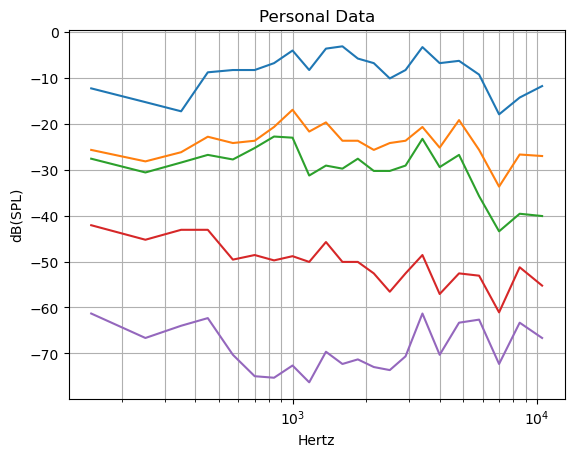

In [10]:
# plot data points
fig, ax = plt.subplots()
ax.set_xscale('log')
ax.grid(True)
ax.grid(which='minor')
plt.plot(dfspl['freq'], dfspl['max'])
plt.plot(dfspl['freq'], dfspl['med'])
plt.plot(dfspl['freq'], dfspl['comf'])
plt.plot(dfspl['freq'], dfspl['soft'])
plt.plot(dfspl['freq'], dfspl['min'])
plt.title('Personal Data')
plt.xlabel('Hertz')
plt.ylabel('dB(SPL)')
plt.show()

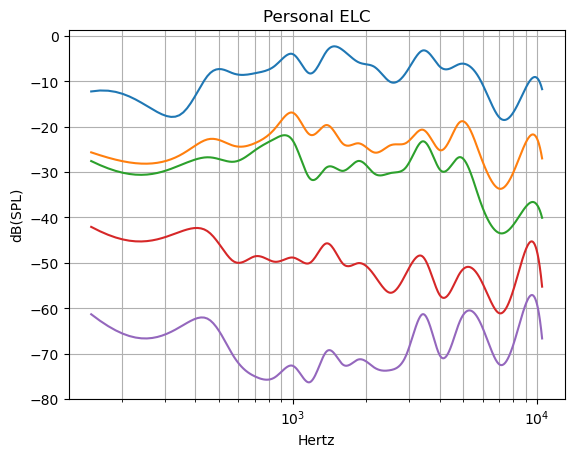

In [11]:
# plot as curves
spline1 = make_interp_spline(dfspl['freq'], dfspl['max'])
spline2 = make_interp_spline(dfspl['freq'], dfspl['med'])
spline3 = make_interp_spline(dfspl['freq'], dfspl['comf'])
spline4 = make_interp_spline(dfspl['freq'], dfspl['soft'])
spline5 = make_interp_spline(dfspl['freq'], dfspl['min'])

xmin = dfspl['freq'].min()
xmax = dfspl['freq'].max()

# evenly spaced numbers for specified interval
x = np.linspace(xmin, xmax, 800)
y1 = spline1(x)
y2 = spline2(x)
y3 = spline3(x)
y4 = spline4(x)
y5 = spline5(x)

fig, ax = plt.subplots()
ax.set_xscale('log')
ax.grid(True)
ax.grid(which='minor')
plt.plot(x, y1)
plt.plot(x, y2)
plt.plot(x, y3)
plt.plot(x, y4)
plt.plot(x, y5)
plt.title('Personal ELC')
plt.xlabel('Hertz')
plt.ylabel('dB(SPL)')
plt.show()

In [12]:
# Normalize values to range of factors (0 = remove, 0.5 = 50% orig amplitude, 1.0 = 100%, 1.5 = 150% etc
# (for use with pydub as multiplicative factor in Fourier domain)

# power conversion
def db_to_p (db):
    return 10**(db/10)

dfnorm = dfspl

# set max to 1.0 and reduce all other frequencies on curve by same factor
dfnorm[['max']] = db_to_p(dfspl[['max']] - dfspl.loc[dfspl['freq']==250, 'max'].iloc[0])
dfnorm[['med']] = db_to_p(dfspl[['med']] - dfspl.loc[dfspl['freq']==250, 'med'].iloc[0])
dfnorm[['comf']] = db_to_p(dfspl[['comf']] - dfspl.loc[dfspl['freq']==250, 'comf'].iloc[0])
dfnorm[['soft']] = db_to_p(dfspl[['soft']] - dfspl.loc[dfspl['freq']==250, 'soft'].iloc[0])
dfnorm[['min']] = db_to_p(dfspl[['min']] - dfspl.loc[dfspl['freq']==250, 'min'].iloc[0])

# pad below and above spectral range with zeroes
dfnorm.loc[len(dfnorm)] = [40, 0, 0, 0, 0, 0]
dfnorm.loc[len(dfnorm)] = [dfnorm['freq'].max()+100, 0, 0, 0, 0, 0]
dfnorm = dfnorm.sort_values(by=['freq']).reset_index(drop=True)

In [13]:
dfnorm

,freq,max,med,comf,soft,min
0,40,0.000000,0.000000,0.000000,0.000000,0.000000
1,150,1.995262,1.778279,1.995262,2.073322,3.414549
2,250,1.000000,1.000000,1.000000,1.000000,1.000000
3,350,0.630957,1.584893,1.646898,1.646898,1.847850
4,450,4.466836,3.447466,2.417315,1.646898,2.712273
5,570,5.011872,2.511886,1.920142,0.368695,0.429866
6,700,5.011872,2.818383,3.414549,0.464159,0.146780
7,840,7.079458,5.623413,6.072022,0.354813,0.135936
8,1000,13.335214,13.335214,5.732358,0.438194,0.251189
9,1170,5.011872,4.466836,0.857696,0.328599,0.107978


In [14]:
# calculate curve arrays in normalized range (for use with pydub)
spline1 = make_interp_spline(dfnorm['freq'], dfnorm['max'])
spline2 = make_interp_spline(dfnorm['freq'], dfnorm['med'])
spline3 = make_interp_spline(dfnorm['freq'], dfnorm['comf'])
spline4 = make_interp_spline(dfnorm['freq'], dfnorm['soft'])
spline5 = make_interp_spline(dfnorm['freq'], dfnorm['min'])

xmin = dfnorm['freq'].min()
xmax = dfnorm['freq'].max()

# evenly spaced numbers for specified interval
x = np.linspace(xmin, xmax, 800)
y1 = spline1(x)
y2 = spline2(x)
y3 = spline3(x)
y4 = spline4(x)
y5 = spline5(x)

#### Perform Audio EQ through these phases:
- Chunk audio file into segments
- Process segments and recombine
- Analyze and play results

**Chunking**

In [15]:
# convert any stereo file to mono and divide into windowed segments
def chunking (filename, size):  # size in ms
    audio = AudioSegment.from_file(filename)
    # convert stereo to mono:
    if audio.channels == 2:
        mono = audio.split_to_mono()
        audio = mono[0].overlay(mono[1])

    num_chunks = ceil(len(audio) / float(size))

    i_range = int(num_chunks)-1
    # add 5% padding at end of each chunk (except final chunk)
    result = [audio[i * size:(i + 1) * size + ceil(size * 0.05)] for i in range(i_range)]
    # last chunk: no end padding
    result.append(audio[i_range * size:])

    return result

**Process each segment and recombine**

In [16]:
# get array of corresponding curve multipliers for given range of frequencies
def get_factor(f, x, y):    
    ftr = []
    for hz in f:
        ftr.append(y[bisect_left(x, hz)-1])  
    # returns array of factor values for each nearest frequency on selected curve
    return ftr

In [17]:
# transform to Fourier domain, adjust,
# inverse transform to time domain,
# recombine with previously processed chunks
# which curve? 'max' (y1), 'med' (y2), 'comf' (y3), 'soft' (y4), or 'min' (y5)
def process_chunk (chunk, result, curve):
    # do process steps
    s = chunk.get_array_of_samples()
    s = np.array(s)
    s = s.reshape(chunk.channels, -1, order='F')
    
    # Transform to Fourier Domain
    z = rfft(s)
    # Corresponding Frequencies
    f = rfftfreq(len(s[0]), 1 / chunk.frame_rate)

    fctr = get_factor(f, x, curve)
    
    # for each z value, multiply by corresponding factor
    new_z = np.multiply(z, fctr)
    
    # inverse transform to return to time domain array
    s2 = irfft(new_z)

    # numpy array to audio segment
    y = np.int16(s2)

    # 16-bit, mono audio segment
    new_chunk = AudioSegment(y.tobytes(), frame_rate=chunk.frame_rate, sample_width=2, channels=1)

    # Recombine overlapping windows
    # add new to correct length of silence, fade old out, fade new in, and overlay the 2
    silent = AudioSegment.silent(duration=len(result))
    size = len(chunk)*0.05
    new_full_length = silent + new_chunk.fade_in(size)

    # new_full_length must call overlay() because
    # it is longer in duration than result from previous iteration
    result = new_full_length.overlay(result.fade_out(size))

    return result 

In [18]:
# wrapper for audio processing
def process_audio (filename, chunk_size, curve):
    chunks = chunking(filename, chunk_size)
    result = AudioSegment.empty()
    for chunk in chunks:
        result = process_chunk(chunk, result, curve)

    # save processed sound file
    result.export('EQ_{}'.format(filename), format='wav')

    return result

**Analyze and Play Results**

Characteristic sound files:
1. "Instrumental" music
2. Popular music: singing and band
3. Speech
4. White noise

In [19]:
# spectrograms comparing results
def spec(file_path):
    y, sr = librosa.load(file_path)
    D = librosa.stft(y)  # STFT of y
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    fig, ax = plt.subplots()
    img = librosa.display.specshow(S_db, ax=ax)
    fig.colorbar(img, ax=ax)
    fig.set_size_inches(35, 9)
    ax.set_title(file_path, fontsize=20)
    plt.show()

In [20]:
# instrumental
instr = 'Bach.wav'
# curve options 'med' (y2), 'comf' (y3), 'soft' (y4)
new_instr = process_audio(instr, 700, y3) -10
orig_instr = AudioSegment.from_file(instr)

In [21]:
orig_instr

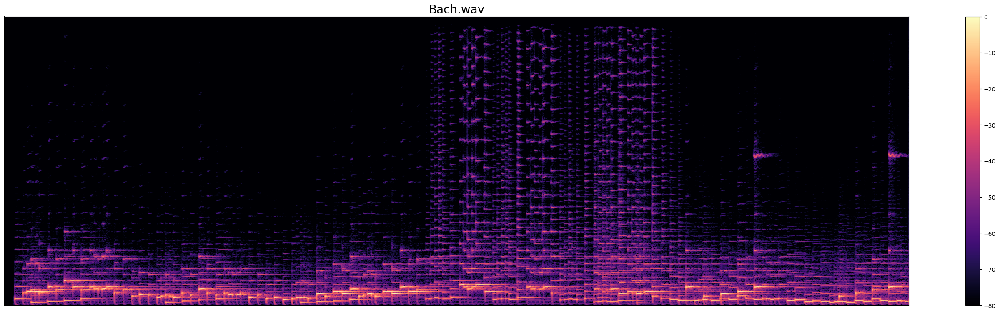

In [22]:
spec(instr)

In [23]:
new_instr

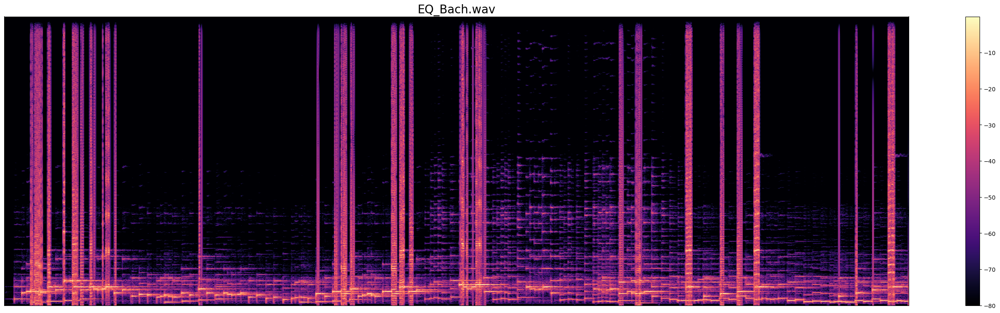

In [24]:
spec('EQ_{}'.format(instr))

In [25]:
# popular music
popul = 'Shakes.wav'
# curve options 'med' (y2), 'comf' (y3), 'soft' (y4)
new_pop = process_audio(popul, 1500, y3) -10
orig_pop = AudioSegment.from_file(popul) -15

In [26]:
orig_pop

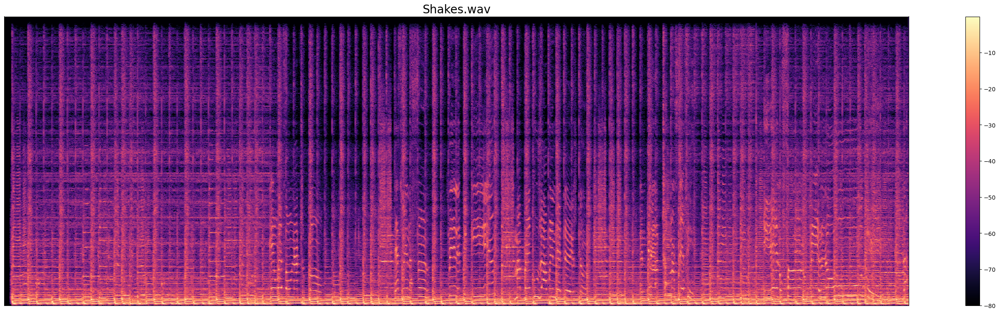

In [27]:
spec(popul)

In [28]:
# WARNING: extremely staticky, turn volume down before listening
new_pop

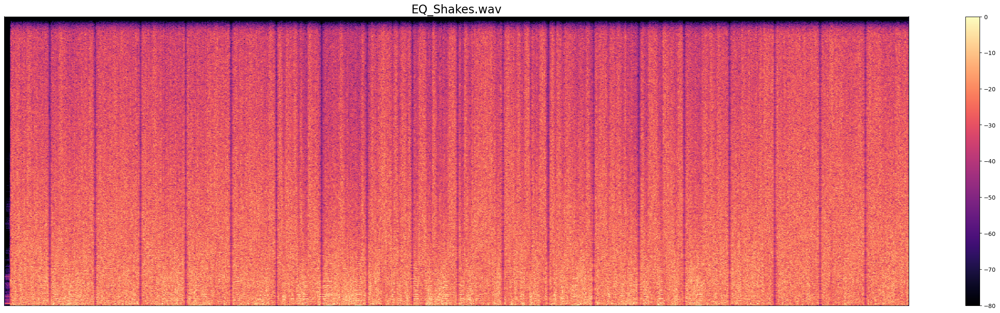

In [29]:
spec('EQ_{}'.format(popul))

In [30]:
# speech
speech = 'LJ-44.wav'
# curve options 'med' (y2), 'comf' (y3), 'soft' (y4)
new_speech = process_audio(speech, 100, y3) -5
orig_speech = AudioSegment.from_file(speech)

In [31]:
orig_speech

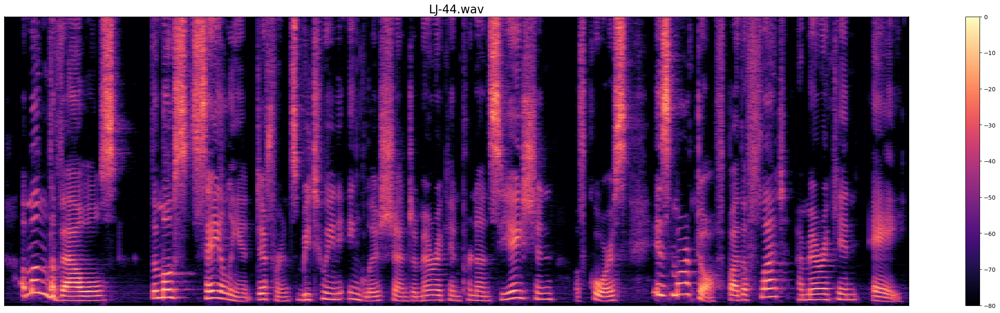

In [32]:
spec(speech)

In [33]:
new_speech

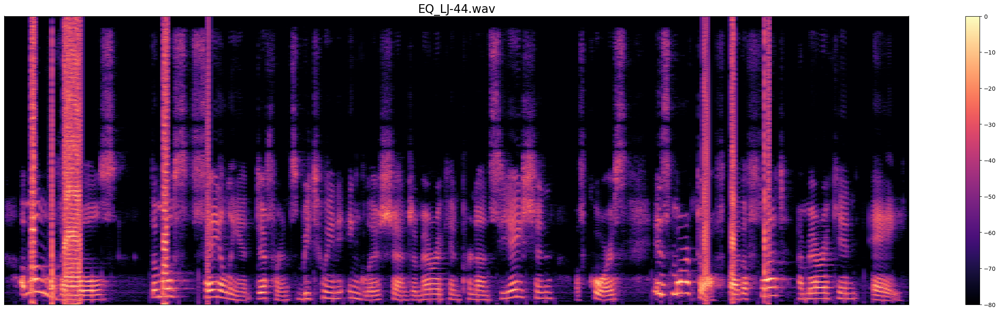

In [34]:
spec('EQ_{}'.format(speech))

In [35]:
# white noise
noise = 'white_noise.wav'
orig_noise = WhiteNoise().to_audio_segment(duration=2000) -30
orig_noise.export(out_f=noise, format='wav')

<_io.BufferedRandom name='white_noise.wav'>

In [36]:
# curve options 'med' (y2), 'comf' (y3), 'soft' (y4)
new_noise = process_audio(noise, 50, y3)

In [37]:
orig_noise

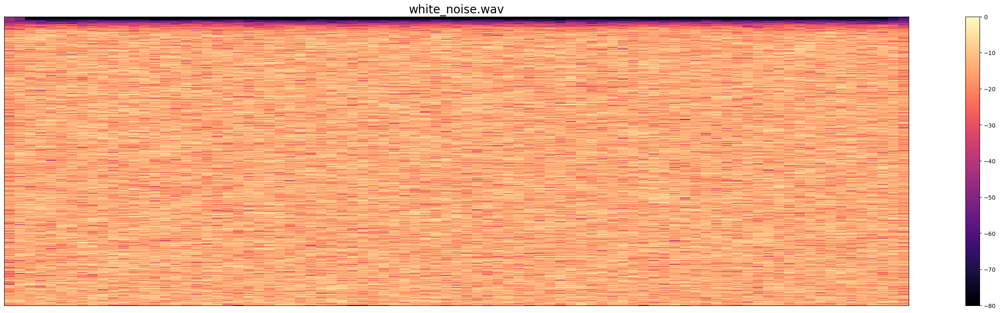

In [38]:
spec(noise)

In [39]:
new_noise

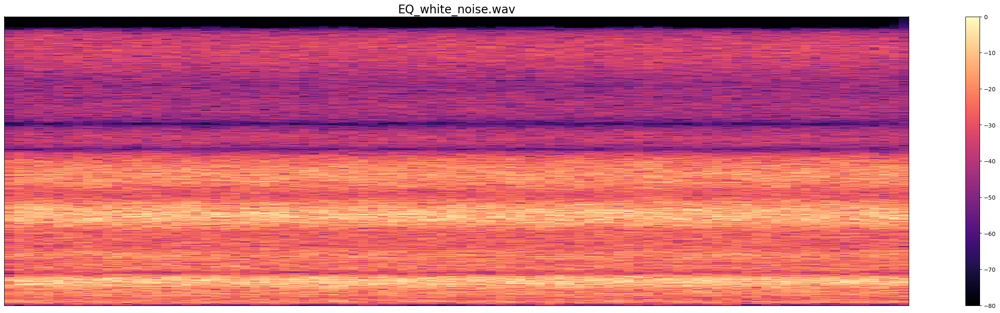

In [40]:
spec('EQ_{}'.format(noise))

END OF PROJECT 1 CODE